# Lending Club Case Study


## Importing Necessary Libraries

In [1]:
import pandas as pd  #To work with dataset
import matplotlib.pyplot as plt  #Data Visualization Libraries
import seaborn as sns  #Data Visualization Libraries
import warnings 
warnings.filterwarnings('ignore')


## Load Data

In [2]:
# Read csv file using pandas
loan_data = pd.read_csv('loan.csv')

In [3]:
# Check first 5 records in dataset
loan_data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [4]:
# Check number of rows and columns
print ("Rows     : " ,loan_data.shape[0])
print ("Columns  : " ,loan_data.shape[1])
print ("\nFeatures : \n" ,loan_data.columns.tolist())

Rows     :  39717
Columns  :  111

Features : 
 ['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title', 'emp_length', 'home_ownership', 'annual_inc', 'verification_status', 'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose', 'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line', 'inq_last_6mths', 'mths_since_last_delinq', 'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'initial_list_status', 'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt', 'next_pymnt_d', 'last_credit_pull_d', 'collections_12_mths_ex_med', 'mths_since_last_major_derog', 'policy_code', 'application_type', 'annual_inc_joint', 'dti_joint', 'verification_status_joint', 'acc_now_delinq', 'tot_coll_amt', 'tot_cur_bal', 'ope

## Data Handling and Cleaning

### Remove rows with loan status as Current

In [5]:
# The records with loan status "Current" will not be useful for analysis because we want to analyze if new applicant can default or not. So we need to check the behaviour of fully paid and charged off records to analyze

loan_data = loan_data[loan_data['loan_status'] != 'Current']

In [6]:
# Records remaining after removing records with loan status "Current"

print ("Rows     : " ,loan_data.shape[0])

Rows     :  38577


### Missing value check

In [7]:
#Find percentage of null values in each column

100*loan_data.isnull().mean()

id                              0.000000
member_id                       0.000000
loan_amnt                       0.000000
funded_amnt                     0.000000
funded_amnt_inv                 0.000000
                                 ...    
tax_liens                       0.101097
tot_hi_cred_lim               100.000000
total_bal_ex_mort             100.000000
total_bc_limit                100.000000
total_il_high_credit_limit    100.000000
Length: 111, dtype: float64

In [8]:
#Find number of columns with 100% null values

(100*loan_data.isnull().mean() == 100.000000).sum()

55

In [9]:
# Drop columns with null values as these columns don't have data 

loan_data.dropna(how="all", axis=1,inplace=True)
loan_data.shape

(38577, 56)

In [10]:
# Check percentage of null values in remaining columns

100*loan_data.isnull().mean()

id                             0.000000
member_id                      0.000000
loan_amnt                      0.000000
funded_amnt                    0.000000
funded_amnt_inv                0.000000
term                           0.000000
int_rate                       0.000000
installment                    0.000000
grade                          0.000000
sub_grade                      0.000000
emp_title                      6.185033
emp_length                     2.677761
home_ownership                 0.000000
annual_inc                     0.000000
verification_status            0.000000
issue_d                        0.000000
loan_status                    0.000000
pymnt_plan                     0.000000
url                            0.000000
desc                          32.472717
purpose                        0.000000
title                          0.028514
zip_code                       0.000000
addr_state                     0.000000
dti                            0.000000


In [11]:
# Drop columns with more than 90% of null values

loan_data.drop(['mths_since_last_record'],axis=1,inplace=True)
loan_data.shape

(38577, 55)

In [12]:
loan_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38577 entries, 0 to 39716
Data columns (total 55 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          38577 non-null  int64  
 1   member_id                   38577 non-null  int64  
 2   loan_amnt                   38577 non-null  int64  
 3   funded_amnt                 38577 non-null  int64  
 4   funded_amnt_inv             38577 non-null  float64
 5   term                        38577 non-null  object 
 6   int_rate                    38577 non-null  object 
 7   installment                 38577 non-null  float64
 8   grade                       38577 non-null  object 
 9   sub_grade                   38577 non-null  object 
 10  emp_title                   36191 non-null  object 
 11  emp_length                  37544 non-null  object 
 12  home_ownership              38577 non-null  object 
 13  annual_inc                  385

### Drop columns with customer behavioural features

In [13]:
# Customer behavioural features are not available at the time of loan application, so they will not be useful for analysing whether new applicant will default or not
# Below are features which are seen when applicants take loan, so we can drop these columns 

loan_data.drop(['delinq_2yrs', 'earliest_cr_line', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d', 'application_type'], axis=1, inplace=True)
loan_data.shape

(38577, 34)

### Drop columns that are not useful for analysis

In [14]:
# url column can be dropped because it has id which is different for everyone, no other info is present in url
# desc column has english words with lot of unwanted characters so it will not be useful for analysis
# zip_code column has only having 3 digits, this numerical data will not help to analyse
# title column has many different values ranging from numeric to characters

loan_data.drop(['url', 'desc', 'zip_code', 'title'], axis=1, inplace=True)
loan_data.shape

(38577, 30)

In [15]:
# Remove columns having same value for all records
# Below columns have same value in each row so there is no distinguishing feature to analyze

loan_data.drop(['pymnt_plan','initial_list_status', 'collections_12_mths_ex_med', 'policy_code', 'acc_now_delinq', 'chargeoff_within_12_mths', 'delinq_amnt', 'tax_liens'], axis=1, inplace=True)
loan_data.shape


(38577, 22)

### Remove unwanted characters

In [16]:
# Remove "months" string from term column, after removing the string we can convert it to int datatype

loan_data['term'] = loan_data['term'].apply(lambda x: x.replace(" months", ""))

# Remove "%" character from int_rate column, after removing the string we can convert it to float datatype

loan_data['int_rate'] = loan_data['int_rate'].apply(lambda x: x.replace("%", ""))


In [17]:
# emp_length column should have values between 0 to 10, so convert "10+ years" to 10 and "< 1 year" to 0

loan_data['emp_length'] = loan_data['emp_length'].apply(lambda x: str(x).replace("+ years","") if str(x) == "10+ years" else ( str(x).replace("< 1 year","0") if (str(x) == "< 1 year") else ( str(x).replace("1 year","1") if (str(x) == "1 year") else str(x).replace("years",""))))

loan_data['emp_length'] = loan_data['emp_length'].apply(lambda x: str(x).strip())

loan_data['emp_length'].value_counts()

10     8488
0      4508
2      4291
3      4012
4      3342
5      3194
1      3169
6      2168
7      1711
8      1435
9      1226
nan    1033
Name: emp_length, dtype: int64

### Imputation

In [18]:
# In emp_lenth imputation with mode value cannot be done because the null values can also mean employees with 0 experience. 
# The mode for emp_length is 10 in this case, if we replace null values with 10 the analysis might go wrong

### Fix incorrect datatype

In [19]:
# Check datatype of all columns
loan_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38577 entries, 0 to 39716
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      38577 non-null  int64  
 1   member_id               38577 non-null  int64  
 2   loan_amnt               38577 non-null  int64  
 3   funded_amnt             38577 non-null  int64  
 4   funded_amnt_inv         38577 non-null  float64
 5   term                    38577 non-null  object 
 6   int_rate                38577 non-null  object 
 7   installment             38577 non-null  float64
 8   grade                   38577 non-null  object 
 9   sub_grade               38577 non-null  object 
 10  emp_title               36191 non-null  object 
 11  emp_length              38577 non-null  object 
 12  home_ownership          38577 non-null  object 
 13  annual_inc              38577 non-null  float64
 14  verification_status     38577 non-null

In [20]:
# Convert term column values to int datatype 
loan_data['term'] = loan_data['term'].astype("int64")

# Convert int_rate column values to float datatype 
loan_data['int_rate'] = loan_data['int_rate'].astype("float64")

# Convert annual_inc column values to int datatype
loan_data['annual_inc'] = loan_data['annual_inc'].astype('int64')

# First change date column to "text" format in csv file then convert to datetime datatype 
#loan_data['issue_d'] = pd.to_datetime(loan_data['issue_d'])

In [21]:
# Check datatype of all columns after changing datatype
loan_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38577 entries, 0 to 39716
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      38577 non-null  int64  
 1   member_id               38577 non-null  int64  
 2   loan_amnt               38577 non-null  int64  
 3   funded_amnt             38577 non-null  int64  
 4   funded_amnt_inv         38577 non-null  float64
 5   term                    38577 non-null  int64  
 6   int_rate                38577 non-null  float64
 7   installment             38577 non-null  float64
 8   grade                   38577 non-null  object 
 9   sub_grade               38577 non-null  object 
 10  emp_title               36191 non-null  object 
 11  emp_length              38577 non-null  object 
 12  home_ownership          38577 non-null  object 
 13  annual_inc              38577 non-null  int64  
 14  verification_status     38577 non-null

## Column Segmentation

In [22]:
# Check unique values with count in each column
for i in loan_data.columns:
    print("Column : ", i, "\n", loan_data[i].value_counts(), "\n") 

Column :  id 
 1077501    1
562133     1
558545     1
562256     1
562224     1
          ..
774290     1
774295     1
772732     1
774265     1
87023      1
Name: id, Length: 38577, dtype: int64 

Column :  member_id 
 1296599    1
723395     1
719001     1
723527     1
723494     1
          ..
976453     1
976458     1
974723     1
976427     1
86999      1
Name: member_id, Length: 38577, dtype: int64 

Column :  loan_amnt 
 10000    2809
12000    2248
5000     2028
6000     1886
15000    1838
         ... 
18325       1
9650        1
20450       1
15425       1
22550       1
Name: loan_amnt, Length: 870, dtype: int64 

Column :  funded_amnt 
 10000    2719
12000    2161
5000     2017
6000     1876
15000    1732
         ... 
1650        1
30100       1
19675       1
21275       1
22350       1
Name: funded_amnt, Length: 1019, dtype: int64 

Column :  funded_amnt_inv 
 5000.000000     1294
10000.000000    1264
6000.000000     1182
12000.000000    1016
8000.000000      887
          

In [23]:
# Print unique values in each column

for i in loan_data.columns:
    print(i,loan_data[i].nunique())

id 38577
member_id 38577
loan_amnt 870
funded_amnt 1019
funded_amnt_inv 8050
term 2
int_rate 370
installment 15022
grade 7
sub_grade 35
emp_title 28027
emp_length 12
home_ownership 5
annual_inc 5185
verification_status 3
issue_d 55
loan_status 2
purpose 14
addr_state 50
dti 2853
mths_since_last_delinq 95
pub_rec_bankruptcies 3


In [24]:
# Split variables into continuous and categorical variables, so that it will become easy to analyse

cont_cols=["loan_amnt", "funded_amnt", "funded_amnt_inv", "int_rate", "installment", "annual_inc", "dti" ]# numerical columns (so many unique values)
cat_cols=["term", "grade", "sub_grade", "emp_title", "emp_length", "home_ownership", "verification_status","issue_d", "loan_status", "purpose", "addr_state", "mths_since_last_delinq", "pub_rec_bankruptcies" ]# categories/very few unique values
id_cols=["id","member_id"]

# Confirm if all columns are covered in splitting
len(cont_cols)+len(cat_cols)+len(id_cols)

22

## Outlier Detection

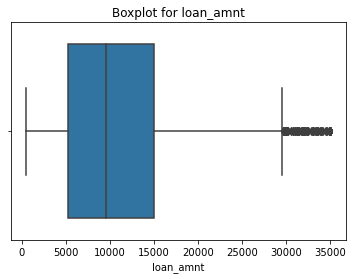

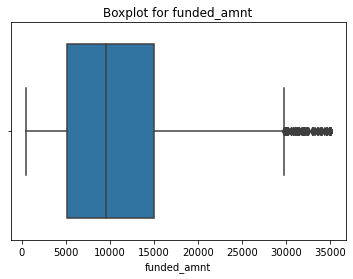

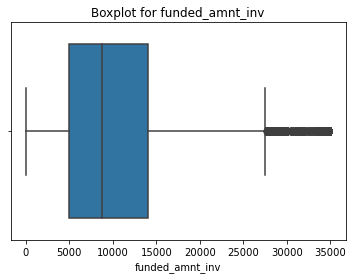

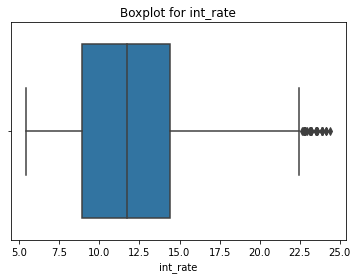

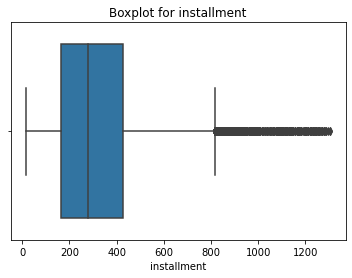

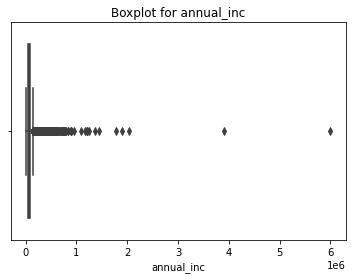

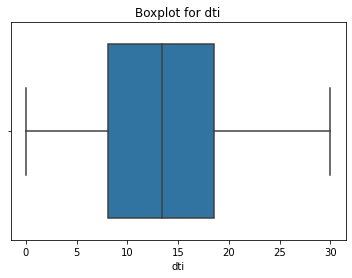

In [25]:
# Visualize all outliers for continuous variables 

for i in cont_cols:
    sns.boxplot(loan_data[i])
    plt.title("Boxplot for "+i)
   
    plt.show()

### Insights

1. Most of the variables have values beyond upper fence.
2. annual_inc has clearly 2 outliers with income 60L and 39L. We can remove these outliers

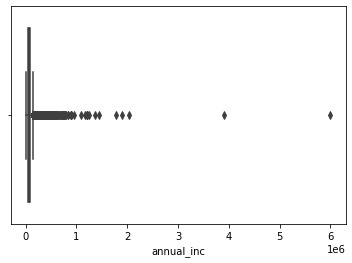

In [26]:
# Box plot for annual_income to detect outliers i.e. before removing outliers

sns.boxplot(loan_data['annual_inc'])
plt.show()

In [27]:
# Number of records before removing outliers 
loan_data.shape[0]

38577

In [28]:
# Keep records with annual_inc less than 30L
loan_data = loan_data[loan_data['annual_inc'] < 3000000]

In [29]:
# Number of records after removing outliers 
loan_data.shape[0]

38575

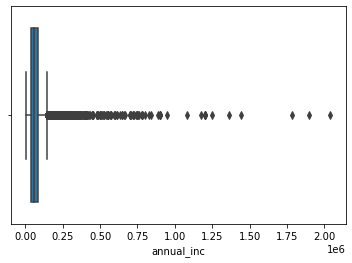

In [30]:
# Box plot for annual_income after removing outliers
sns.boxplot(loan_data['annual_inc'])
plt.show()

## Type Driven Metrics - Binning 

In [31]:
# To convert annual income into bins. This is because it will be easy to analyze large amount of data after converting into bins

def annual_inc_category(income) :
    
    if (income <= 20000):
        return "Income_lt_20K"
    elif (income > 20000) & (income <= 40000):
        return "Income_20K-40K"
    elif (income > 40000) & (income <= 60000):
        return "Income_40K-60K"
    elif (income > 60000) & (income <= 80000):
        return "Income_60K-80K"
    elif (income > 80000) & (income <= 100000):
        return "Income_80K-1L"
    elif income > 100000:
        return "Income_gt_1L"
    
loan_data["annual_inc_category"] = loan_data['annual_inc'].apply(lambda income: annual_inc_category(income))


In [32]:
# Check values of newly created column
loan_data['annual_inc_category'].value_counts()

Income_40K-60K    11263
Income_20K-40K     8518
Income_60K-80K     7621
Income_gt_1L       5479
Income_80K-1L      4514
Income_lt_20K      1180
Name: annual_inc_category, dtype: int64

In [33]:
# To convert dti values into bins. This is because it will become easy to visualize dti against some other parameter

def dti_categ(dti) :

    if (dti > 0.00) & (dti <= 4.00):
        return "0-6"
    elif (dti > 4.00) & (dti <= 8.00):
        return "6-12"
    elif (dti > 8.00) & (dti <= 12.00):
        return "12-18"
    elif (dti > 12.00) & (dti <= 16.00):
        return "18-24"
    elif (dti > 16.00) & (dti <= 20.00):
        return "18-24"
    elif dti > 20.00:
        return "24+"

loan_data["dti_category"] = loan_data['dti'].apply(lambda value: dti_categ(value))


In [34]:
# Check values of newly created column
loan_data['dti_category'].value_counts()

18-24    14716
12-18     7226
24+       7201
6-12      5627
0-6       3627
Name: dti_category, dtype: int64

## Data Driven Metrics 

In [35]:
# Extract loan issue month and year from date column
df_month_year = loan_data['issue_d'].str.partition("-", True)     
loan_data['issue_month']=df_month_year[0]                       
loan_data['issue_year']='20' + df_month_year[2]

## Univariate Analysis

In [36]:
# To visualize graphs with plotly
import plotly.offline as py 
py.init_notebook_mode(connected=True) # this code, allow us to work with offline plotly version
import plotly.graph_objs as go # it's like "plt" of matplot
import plotly.tools as tls # It's useful to we get some tools of plotly
import warnings # This library will be used to ignore some warnings
from collections import Counter # To do counter of some features

In [37]:
# Univariate analysis for Fully Paid/ Charged Off distribution.

tr0 = go.Bar(
            x = loan_data[loan_data["loan_status"]== 'Fully Paid']["loan_status"].value_counts().index.values,
            y = loan_data[loan_data["loan_status"]== 'Fully Paid']["loan_status"].value_counts().values,
            name='Fully Paid'
    )

tr1 = go.Bar(
            x = loan_data[loan_data["loan_status"]== 'Charged Off']["loan_status"].value_counts().index.values,
            y = loan_data[loan_data["loan_status"]== 'Charged Off']["loan_status"].value_counts().values,
            name='Charged Off'
    )

data = [tr0, tr1]

layout = go.Layout(
    
)

layout = go.Layout(
    yaxis=dict(
        title='Count'
    ),
    xaxis=dict(
        title='Loan Status Variable'
    ),
    title='Fully Paid/Charged Off distribution'
)

fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='grouped-bar')

## Insights 

1. Fully paid applicants are more in number as compared to charged off

<AxesSubplot:xlabel='issue_year', ylabel='count'>

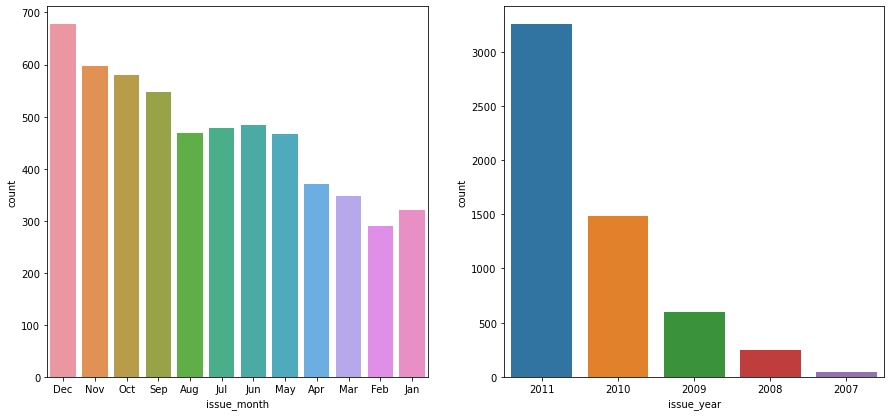

In [39]:
plt.figure(figsize=(15,15))
plt.subplot(221)
sns.countplot(x='issue_month', data=loan_data[loan_data['loan_status']=='Charged Off'])
plt.subplot(222)
sns.countplot(x='issue_year', data=loan_data[loan_data['loan_status']=='Charged Off'])

## Insights
1. Many applicants loan is issued at the end of year. Increasing pattern can be seen in graph, over the months
2. Agents can try to engage with lenders at the end of year
3. Loan issued in the year 2011 were high also as compared to other years

## Bivariate Analysis

In [40]:

df_full = loan_data[loan_data["loan_status"] == 'Fully Paid']
df_charged = loan_data[loan_data["loan_status"] == 'Charged Off']
tr0 = go.Box(
    y=df_full["int_rate"],
    x=df_full["annual_inc_category"],
    name='Fully Paid',
    marker=dict(
        color='#3D9970'
    )
)

tr1 = go.Box(
    y=df_charged['int_rate'],
    x=df_charged['annual_inc_category'],
    name='Charged Off',
    marker=dict(
        color='#FF4136'
    )
)
    
data = [tr0, tr1]

layout = go.Layout(
    yaxis=dict(
        title='Interest Rate',
        zeroline=False
    ),
    xaxis=dict(
        title='Annual Income Category'
    ),
    boxmode='group'
)
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='box-age-cat')

## Insights

1. For each annual income category if the interest rate goes beyond threshold it is likely that applicant will default.
   Ex- Income greater than 1L if interest rate is above 15, chances are there that applicant will default


2. For each annual income category the median values for fully paid is less than charged off.

3. For each annual income category the interest rate is around 11 for fully paid and 14 for charged off 

## Recommendations

1. Interest rate beyond certain threshold for specific income category will result in defaulter category. So it is recommended that interest rate should not be more than threshold 

In [41]:
df_good = loan_data[loan_data["loan_status"] == 'Fully Paid']
df_bad = loan_data[loan_data["loan_status"] == 'Charged Off']

tr0 = go.Box(
    y=df_good["loan_amnt"],
    x=df_good["annual_inc_category"],
    name='Fully Paid',
    marker=dict(
        color='#3D9970'
    )
)

tr1 = go.Box(
    y=df_bad['loan_amnt'],
    x=df_bad['annual_inc_category'],
    name='Charged Off',
    marker=dict(
        color='#FF4136'
    )
)
    
data = [tr0, tr1]

layout = go.Layout(
    yaxis=dict(
        title='Loan Amount',
        zeroline=False
    ),
    xaxis=dict(
        title='Annual Income Category'
    ),
    boxmode='group'
)
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='box-age-cat')

## Insights

1. There is increasing correlation between income and loan amount.
2. People with more income tend to take more loan amount
3. Observation is that if people take more loan amount then there are chances that they default.
   Ex - For income greater than 1L, loan amount of 15K is fully paid but loan amount of 20K is charged off 

## Recommendations

1. Loan amount sanctioned should not be more than a threshold for specific annual income category

In [42]:

df_nondefault = loan_data.loc[loan_data["loan_status"] == 'Fully Paid']['dti_category'].values.tolist()
df_default = loan_data.loc[loan_data["loan_status"] == 'Charged Off']['dti_category'].values.tolist()
df_grade = loan_data['dti_category'].values.tolist()

#First plot
tr0 = go.Histogram(
    x=df_nondefault,
    histnorm='probability',
    name="Fully Paid"
)
#Second plot
tr1 = go.Histogram(
    x=df_default,
    histnorm='probability',
    name="Charged Off"
)

#Third plot
tr2 = go.Histogram(
    x=df_grade,
    histnorm='probability',
    name="Overall Distribution"
)


#Creating the grid
fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                          subplot_titles=('Fully Paid','Charged Off', 'General Distribution'))

#setting the figs
fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 2)
fig.append_trace(tr2, 2, 1)

fig['layout'].update(showlegend=True, title='DTI Distribuition', bargap=0.05)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')

C:\Users\aparna.bindage\Anaconda3\lib\site-packages\plotly\tools.py:461: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



## Insights

1. Applicants having dti ratio between 18-24 have chances of getting defaulted.

## Recommendations 

1. Before giving loan, dti value along with some other parameter should be checked

In [43]:

df_nondefault = loan_data.loc[loan_data["loan_status"] == 'Fully Paid']['grade'].values.tolist()
df_default = loan_data.loc[loan_data["loan_status"] == 'Charged Off']['grade'].values.tolist()
df_grade = loan_data['grade'].values.tolist()

#First plot
tr0 = go.Histogram(
    x=df_nondefault,
    histnorm='probability',
    name="Fully Paid"
)
#Second plot
tr1 = go.Histogram(
    x=df_default,
    histnorm='probability',
    name="Charged Off"
)

#Third plot
tr2 = go.Histogram(
    x=df_grade,
    histnorm='probability',
    name="Overall Distribution"
)


#Creating the grid
fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                          subplot_titles=('Fully Paid','Charged Off', 'General Distribution'))

#setting the figs
fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 2)
fig.append_trace(tr2, 2, 1)

fig['layout'].update(showlegend=True, title='Grade Distribuition', bargap=0.05)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')

## Insights 

1. Applicants with grade A are less likely to default
2. Applicants having grade with B and C are more likely to default
3. There is normal distribution in data from grade A to G


## Recommendation

1. Grade of applicant should be checked along with other parameter to tell if applicant can default or not

In [44]:
df_nondefault = loan_data.loc[loan_data["loan_status"] == 'Fully Paid']['term'].values.tolist()
df_default = loan_data.loc[loan_data["loan_status"] == 'Charged Off']['term'].values.tolist()
df_grade = loan_data['term'].values.tolist()

#First plot
tr0 = go.Histogram(
    x=df_nondefault,
    histnorm='probability',
    name="Fully Paid"
)
#Second plot
tr1 = go.Histogram(
    x=df_default,
    histnorm='probability',
    name="Charged Off"
)

#Third plot
tr2 = go.Histogram(
    x=df_grade,
    histnorm='probability',
    name="Overall Distribution"
)


#Creating the grid
fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                          subplot_titles=('Fully Paid','Charged Off', 'General Distribution'))

#setting the figs
fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 2)
fig.append_trace(tr2, 2, 1)

fig['layout'].update(showlegend=True, title='Term Distribuition', bargap=0.05)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')

## Insights

1. Applicants taking loan for 60 month terms are likely to be defaulted, when compared with fully paid.

## Recommendations

1. Applicants taking loan for 60 months need to verified with some other parameters as well

In [45]:
df_nondefault = loan_data.loc[loan_data["loan_status"] == 'Fully Paid']['home_ownership'].values.tolist()
df_default = loan_data.loc[loan_data["loan_status"] == 'Charged Off']['home_ownership'].values.tolist()
df_grade = loan_data['home_ownership'].values.tolist()

#First plot
tr0 = go.Histogram(
    x=df_nondefault,
    histnorm='probability',
    name="Fully Paid"
)
#Second plot
tr1 = go.Histogram(
    x=df_default,
    histnorm='probability',
    name="Charged Off"
)

#Third plot
tr2 = go.Histogram(
    x=df_grade,
    histnorm='probability',
    name="Overall Distribution"
)


#Creating the grid
fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                          subplot_titles=('Fully Paid','Charged Off', 'General Distribution'))

#setting the figs
fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 2)
fig.append_trace(tr2, 2, 1)

fig['layout'].update(showlegend=True, title='Home-Ownership Distribuition', bargap=0.05)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')

## Insights

1. Applicants having home_ownership status with rent and mortgage are likely to default as compared to owners

In [46]:
df_nondefault = loan_data.loc[loan_data["loan_status"] == 'Fully Paid']['purpose'].values.tolist()
df_default = loan_data.loc[loan_data["loan_status"] == 'Charged Off']['purpose'].values.tolist()
df_grade = loan_data['purpose'].values.tolist()

#First plot
tr0 = go.Histogram(
    x=df_nondefault,
    histnorm='probability',
    name="Fully Paid"
)
#Second plot
tr1 = go.Histogram(
    x=df_default,
    histnorm='probability',
    name="Charged Off"
)

#Third plot
tr2 = go.Histogram(
    x=df_grade,
    histnorm='probability',
    name="Overall Grade"
)


#Creating the grid
fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                          subplot_titles=('Fully Paid','Charged Off', 'General Distribution'))

#setting the figs
fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 2)
fig.append_trace(tr2, 2, 1)

fig['layout'].update(showlegend=True, title='Purpose Distribuition', bargap=0.05)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')

## Insights 

1. Applicants with loan granted for debt consolidation purpose are likely to be defaulted

In [47]:
df_nondefault = loan_data.loc[loan_data["loan_status"] == 'Fully Paid']['addr_state'].values.tolist()
df_default = loan_data.loc[loan_data["loan_status"] == 'Charged Off']['addr_state'].values.tolist()
df_grade = loan_data['addr_state'].values.tolist()

#First plot
tr0 = go.Histogram(
    x=df_nondefault,
    histnorm='probability',
    name="Fully Paid"
)
#Second plot
tr1 = go.Histogram(
    x=df_default,
    histnorm='probability',
    name="Charged Off"
)

#Third plot
tr2 = go.Histogram(
    x=df_grade,
    histnorm='probability',
    name="Overall Grade"
)


#Creating the grid
fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                          subplot_titles=('Fully Paid','Charged Off', 'General Distribution'))

#setting the figs
fig.append_trace(tr0, 1, 1)
fig.append_trace(tr1, 1, 2)
fig.append_trace(tr2, 2, 1)

fig['layout'].update(showlegend=True, title='Addr_State Distribuition', bargap=0.05)
py.iplot(fig, filename='custom-sized-subplot-with-subplot-titles')

## Insights

1. Majority of the defaulters can be seen from state CA. Then from NY and FL state.

# Five Important Driver Variables

### 1. Interest Rate 
### 2. Loam Amount
### 3. DTI
### 4. Grade
### 5. Term 

# Less impacted variables
### 1. Home Ownership
### 2. Purpose
### 3. Address State